# Import




In [2]:
import numpy as np
import sys 
import os
sys.path.append("../")
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from pyflann import *
from utils import *
import tensorflow as tf
import functools
from matplotlib.collections import LineCollection
from scipy.stats import spearmanr
from tensorflow.python.ops import array_ops
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning) 
import scipy.misc as scm
from keras_vggface.vggface import VGGFace
from keras_vggface.utils import decode_predictions
from scipy.spatial.distance import cosine
from skimage.segmentation import mark_boundaries
from skimage import morphology

In [7]:
main_dir = '../output/explainer'
attribute = ['Smiling','Young', 'No-Beard', 'Heavy-MakeUp', 'BlackHair', 'Bangs']
gan_exp = ['CelebA-Smile-Binary/test', \
           'CelebA-Young-Binary/test',\
           'CelebA-NoBeard-Binary/test',\
           'CelebA-HeavyMakeUp-Binary/test',\
           'CelebA-BlackHair-Binary/test', \
           'CelebA-Bangs-Binary/test']
start = [[''],[''],[''], [''],[''], ['']]
main_index = [1,1,1,1,1,1]
num_channel = [3,3,3,3,3,3]
num_cls = [2,2,2,2,2,2]
n = 6
num_bins = 10
input_size = 128

# Read Numpy Arrays

In [ ]:
input_img = []
input_pred = []
fake_img = []
fake_pred = []

In [8]:
for i in range(n):
    for j in range(len(start[i])):
        i_img = np.load(os.path.join(main_dir, gan_exp[i], 'real_img'+str(start[i][j])+'.npy'))
        i_pred = np.load(os.path.join(main_dir, gan_exp[i], 'real_pred'+str(start[i][j])+'.npy'))
        f_img = np.load(os.path.join(main_dir, gan_exp[i], 'fake_images'+str(start[i][j])+'.npy'))
        f_pred = np.load(os.path.join(main_dir, gan_exp[i], 'fake_pred'+str(start[i][j])+'.npy'))                
        if j == 0:
            i_img_all = i_img
            f_img_all = f_img
            i_pred_all = i_pred
            f_pred_all = f_pred            
        else:
            i_img_all = np.append(i_img_all,i_img,axis=0)
            f_img_all = np.append(f_img_all,f_img,axis=0)
            i_pred_all = np.append(i_pred_all,i_pred,axis=0)
            f_pred_all = np.append(f_pred_all,f_pred,axis=0)
    print(attribute[i], i_img_all.shape)
    print(attribute[i], f_img_all.shape)
    print(attribute[i], i_pred_all.shape)
    print(attribute[i], f_pred_all.shape)
    input_img.append(i_img_all)
    fake_img.append(f_img_all)
    input_pred.append(i_pred_all)
    fake_pred.append(f_pred_all)

('Bangs', (3992, 128, 128, 3))
('Bangs', (39920, 128, 128, 3))
('Bangs', (39920, 2))
('Bangs', (39920, 2))


In [46]:
a_input_img = []
a_fake_img = []
for i in range(0,n): 
    input_img1 = inverse_image(input_img[i])
    fake_img1 = inverse_image(fake_img[i])
    fake_img1 = np.reshape(fake_img1, [-1,num_bins,input_size,input_size,num_channel[i]])
    a_input_img.append(input_img1)
    a_fake_img.append(fake_img1)
    print(input_img1.shape, fake_img1.shape)

((4000, 128, 128, 3), (4000, 10, 128, 128, 3))
((5244, 128, 128, 3), (5244, 10, 128, 128, 3))
((2004, 128, 128, 3), (2004, 10, 128, 128, 3))
((1604, 128, 128, 3), (1604, 10, 128, 128, 3))
((1604, 128, 128, 3), (1604, 10, 128, 128, 3))
((3992, 128, 128, 3), (3992, 10, 128, 128, 3))


In [10]:
for i in range(0,n):
    input_pred[i] = np.reshape(input_pred[i], [-1,num_bins,num_cls[i]])
    input_pred[i] = np.mean(input_pred[i], axis=1)
    fake_pred[i] = np.reshape(fake_pred[i], [-1,num_bins,num_cls[i]])    
    print(input_pred[i].shape, fake_pred[i].shape)

((4000, 2), (4000, 10, 2))
((5244, 2), (5244, 10, 2))
((2004, 2), (2004, 10, 2))
((1604, 2), (1604, 10, 2))
((1604, 2), (1604, 10, 2))
((3992, 2), (3992, 10, 2))


# Plot Few Images

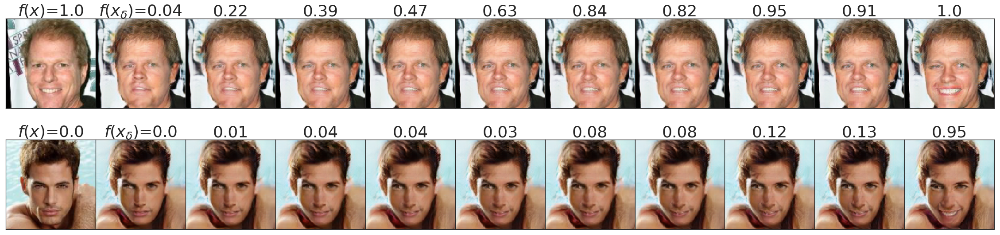

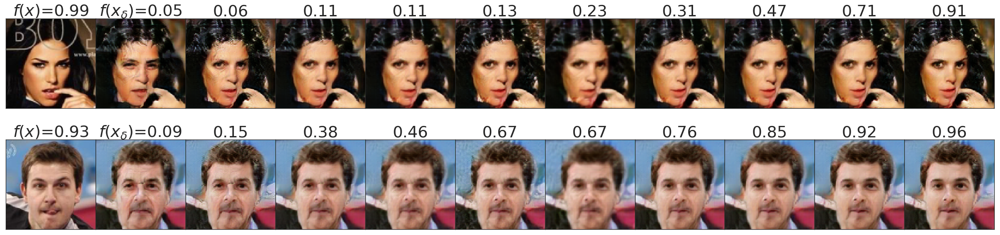

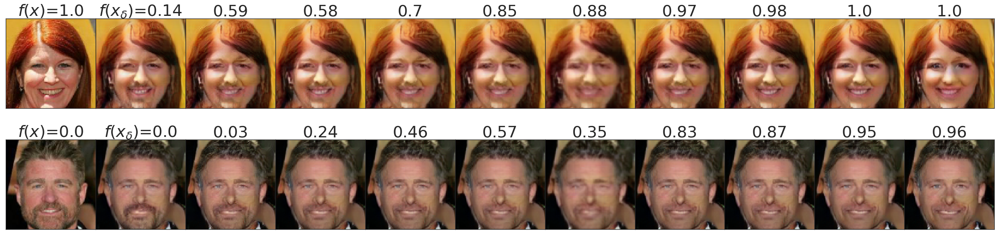

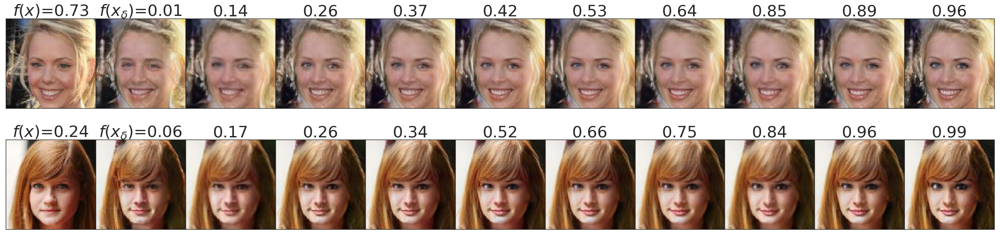

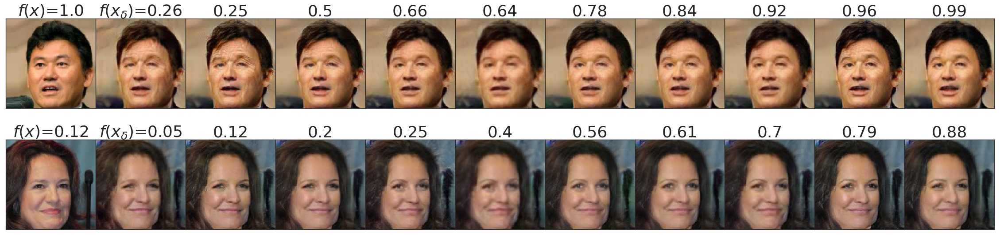

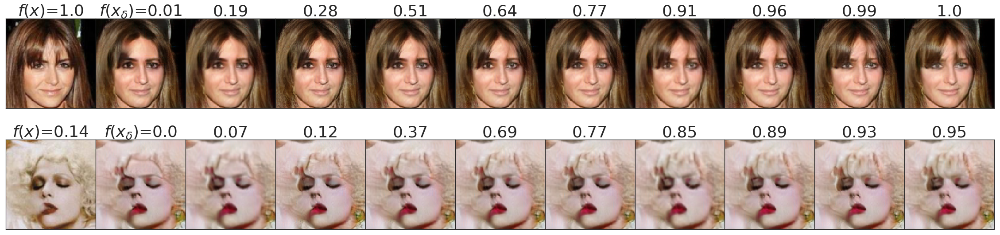

In [34]:
sns.set(style="white")
sns.set_context("notebook", font_scale=3, rc={"lines.linewidth": 2})

samples = [[2,4],[12,14],[32,15], [2,51], [11,33], [8,53]]
for i in range(n):
    fig = plt.figure(figsize = (40,50))
    counter = 0
    for index in samples[i]:
        counter+=1
        plt.subplot(10,11,counter)
        plt.imshow(a_input_img[i][index])
        plt.xticks([])
        plt.yticks([])
        plt.title('$f(x)$=' + str(np.round(input_pred[i][index][main_index[i]],decimals=2)))
        for j in range(num_bins):
            counter+=1
            plt.subplot(10,11,counter)
            plt.imshow(a_fake_img[i][index][j])
            if j == 0:
                value = np.round(fake_pred[i][index][j][main_index[i]],decimals=2)
                plt.title(r'$f(x_{\delta})$='+str(value))
            else:
                plt.title(np.round(fake_pred[i][index][j][main_index[i]],decimals=2))
            plt.xticks([])
            plt.yticks([])
    plt.subplots_adjust(wspace=0, hspace=0.1)
    plt.show()

## Final Plot

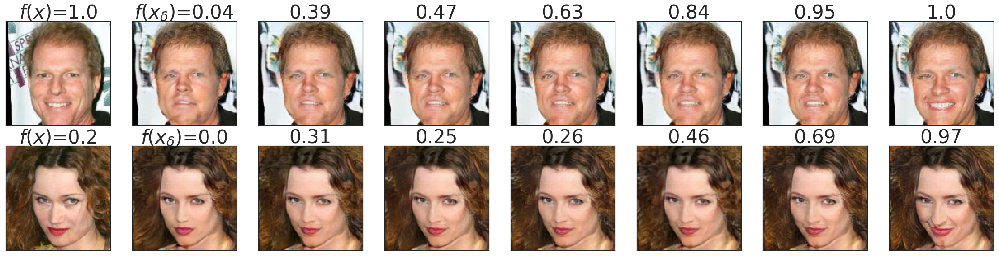

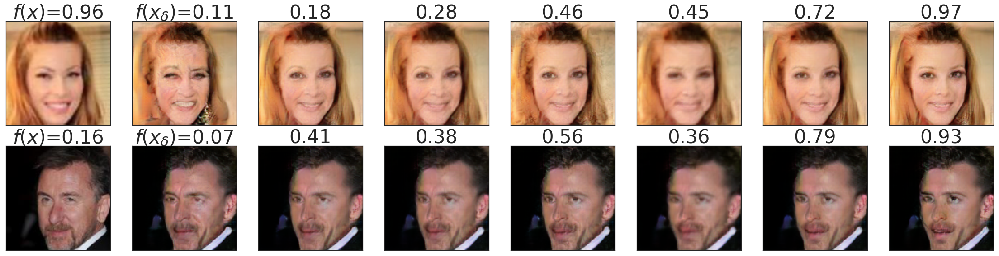

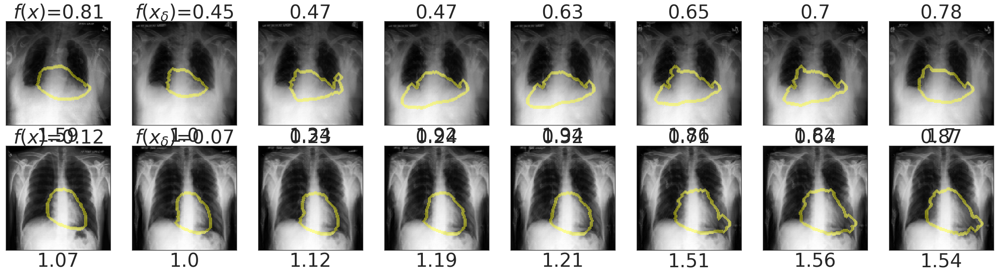

In [10]:
sns.set(style="white")
sns.set_context("notebook", font_scale=3.5, rc={"lines.linewidth": 2})

samples = [[2,114],[112,114],[155,64]]
for i in range(0,3):
    fig = plt.figure(figsize = (40,50))
    counter = 0
    for index in samples[i]:
        counter+=1
        plt.subplot(10,8,counter)
        if i != 2:
            plt.imshow(a_input_img[i][index])
        else:
            plt.imshow(a_input_img[i][index], cmap='gray')
            a3 =img_seg_only_heart[index]
            a4 = morphology.binary_dilation(a3)
            a5 = morphology.binary_dilation(a4)
            a3 = a3+a4+a5
            edges_pz = mark_boundaries(a_input_img[i][index], a3,color=(1,1,0), mode='thick')
            plt.imshow(edges_pz, alpha=0.4)
            v = float(volume_real[index])/volume_fake[index][0]
            v = np.round(v,decimals=2)
            plt.xlabel(v)

        plt.xticks([])
        plt.yticks([])
        plt.title('$f(x)$=' + str(np.round(input_pred[i][index][main_index[i]],decimals=2)))
        for j in range(10):
            if j in [1,6,8]:
                continue
            counter+=1
            plt.subplot(10,8,counter)
            if i != 2:
                plt.imshow(a_fake_img[i][index][j])
            else:
                plt.imshow(a_fake_img[i][index][j], cmap='gray')
                a3 =fake_img_seg_only_heart[index][j]
                a4 = morphology.binary_dilation(a3)
                a5 = morphology.binary_dilation(a4)
                a3 = a3+a4+a5
                edges_pz = mark_boundaries(a_input_img[i][index], a3,color=(1,1,0), mode='thick')
                plt.imshow(edges_pz, alpha=0.4)
                v= float(volume_fake[index][j])/volume_fake[index][0]
                v = np.round(v,decimals=2)
                plt.xlabel(v)
            if j == 0:
                value = np.round(fake_pred[i][index][j][main_index[i]],decimals=2)
                plt.title(r'$f(x_{\delta})$='+str(value))
            else:
                plt.title(np.round(fake_pred[i][index][j][main_index[i]],decimals=2))
            plt.xticks([])
            plt.yticks([])
    plt.subplots_adjust(wspace=0, hspace=0.2)
    plt.show()

# Test: Generated images are fooling the classifier

In [35]:
all_bins = []
for i in range(n):
    print(input_pred[i].shape, fake_pred[i].shape)
    bins =  np.asarray(input_pred[i][:,main_index[i]]*10).astype(int)
    print(bins.shape)
    print(np.unique(bins,return_counts=True))
    print(np.min(np.unique(bins,return_counts=True)[1]))
    all_bins.append(bins)
    fake_pred[i] = np.reshape(fake_pred[i], [-1,num_cls[i]])
    print(input_pred[i].shape, fake_pred[i].shape)

((4000, 2), (4000, 10, 2))
(4000,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([403, 361, 388, 358, 474, 417, 416, 407, 388, 388]))
358
((4000, 2), (40000, 2))
((5244, 2), (5244, 10, 2))
(5244,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([524, 572, 494, 498, 519, 536, 536, 519, 514, 532]))
494
((5244, 2), (52440, 2))
((2004, 2), (2004, 10, 2))
(2004,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([211, 216, 178, 186, 176, 194, 201, 213, 230, 199]))
176
((2004, 2), (20040, 2))
((1604, 2), (1604, 10, 2))
(1604,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([191, 161, 146, 144, 158, 163, 157, 176, 158, 150]))
144
((1604, 2), (16040, 2))
((1604, 2), (1604, 10, 2))
(1604,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([169, 159, 156, 152, 174, 153, 143, 176, 166, 156]))
143
((1604, 2), (16040, 2))
((3992, 2), (3992, 10, 2))
(3992,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([432, 397, 400, 424, 383, 394, 410, 363, 378, 411]))
363
((3992, 2), (39920, 2))


In [36]:
all_target_bins = []
all_source_bins = []
all_target_pred = []
all_source_pred = []
all_delta = []
for i in range(n):
    target_bin = np.tile(np.asarray(range(10)),all_bins[i].shape[0])
    source_bin = np.repeat(all_bins[i], repeats=10)
    source_pred = np.repeat(input_pred[i][:,main_index[i]], repeats=10)
    target_pred = fake_pred[i][:,main_index[i]]
    delta = target_bin-source_bin
    print(target_bin.shape, source_bin.shape, source_pred.shape,target_pred.shape,delta.shape)
    print(np.min(delta), np.max(delta))
    all_target_bins.append(target_bin)
    all_source_bins.append(source_bin)
    all_target_pred.append(target_pred)
    all_source_pred.append(source_pred)
    all_delta.append(delta)

((40000,), (40000,), (40000,), (40000,), (40000,))
(-9, 9)
((52440,), (52440,), (52440,), (52440,), (52440,))
(-9, 9)
((20040,), (20040,), (20040,), (20040,), (20040,))
(-9, 9)
((16040,), (16040,), (16040,), (16040,), (16040,))
(-9, 9)
((16040,), (16040,), (16040,), (16040,), (16040,))
(-9, 9)
((39920,), (39920,), (39920,), (39920,), (39920,))
(-9, 9)


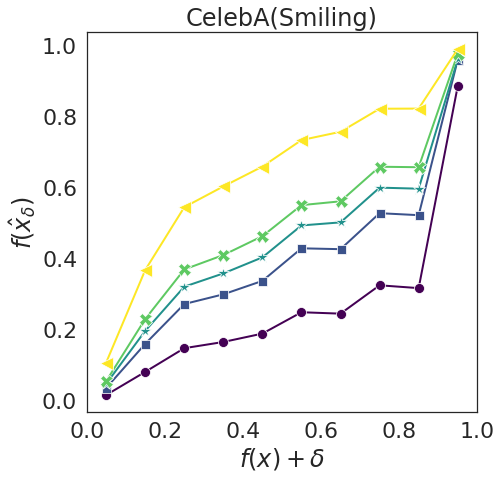

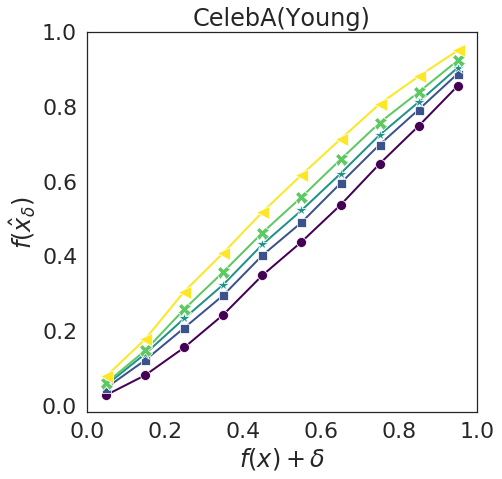

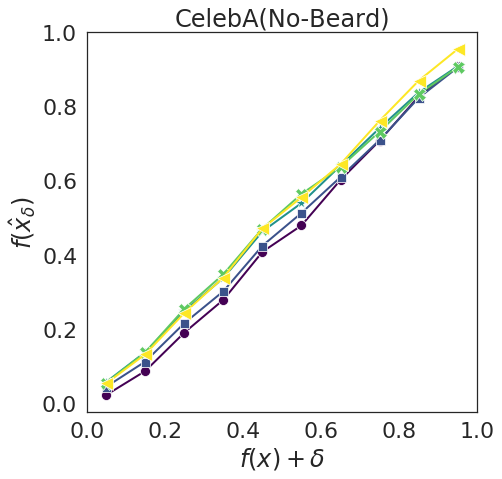

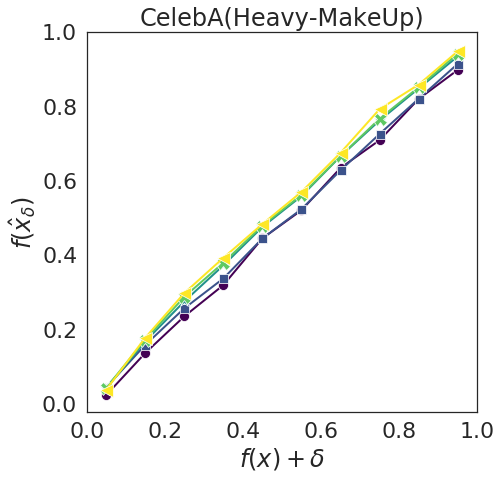

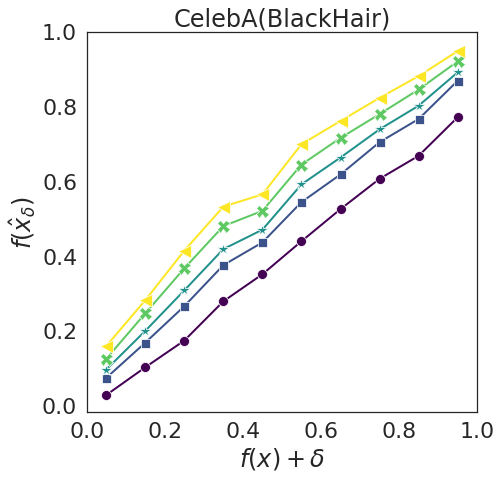

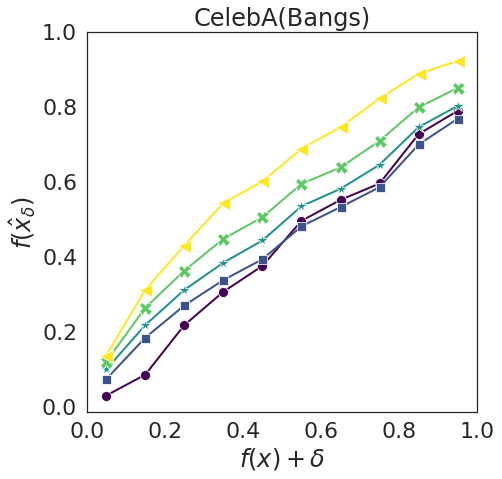

In [37]:
for iii in range(n):
    real_p = all_target_bins[iii] * 0.1
    real_p_ = (all_target_bins[iii]+1) * 0.1
    real_p = (real_p + real_p_)/2
    fake_q = all_target_pred[iii]
    
    from matplotlib import cm
    colors = cm.get_cmap('viridis', 5)
    newcolors = colors(np.linspace(0, 1, 5))
    #newcmp = ListedColormap(newcolors)
    import seaborn as sns
    sns.set(style="white")
    sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 2})
    fig = plt.figure(figsize = (7,7))
    names = ['0.0-0.2', '', '0.2-0.4', '0.30-0.40', '0.4-0.6', '0.50-0.60', \
             '0.6-0.8', '0.70-0.80', '0.8-1.0', '0.90-1.00']
    makrker_size = [10,0,9,0,13,0,13,0,13,0]
    markers = ['o', '','s','','*', '','X', 'X', '<', '>', 's', '*', 'D', 'd', 'X']
    x = np.arange(0.0, 1.0, step=0.1)
    #plt.plot(x, x,c='black',linestyle='dashed',alpha=0.5) # dashdot black
    for i in range(0,10,2):
        index = np.where(all_source_bins[iii] == i)
        target_pred_i = fake_q[index]
        source_pred_i = real_p[index]
        index = np.where(all_source_bins[iii] == i+1)
        target_pred_i = np.append(target_pred_i, fake_q[index],axis=0)
        source_pred_i = np.append(source_pred_i,real_p[index],axis=0)
        target_pred_i = np.reshape(target_pred_i,[-1,10])
        source_pred_i = np.reshape(source_pred_i,[-1,10])
        
        
        mean_t = np.mean(target_pred_i,0)
        sd_t = np.std(target_pred_i,0)           
        mean_s = np.mean(source_pred_i,0)
        sd_s = np.std(source_pred_i,0)
        x_axis = np.arange(0.0, 1.0, step=0.1)
        #ax = sns.lineplot(mean_s, mean_t, markers=True, dashes=True)
        ax = sns.lineplot(mean_s,mean_t,label=names[i],c=newcolors[int(i/2)],\
                              alpha=1,marker=markers[i], markersize=makrker_size[i])
    plt.xticks(np.arange(0, 1.1, step=0.2))
    plt.yticks(np.arange(0, 1.1, step=0.2))
    ax.get_legend().remove()
    #plt.legend(loc=2)
    plt.xlabel( r'$f(x)+\delta$' )
    plt.ylabel(r'$f(\hat{x}_{\delta})$')
    plt.title('CelebA('+attribute[iii]+')')
    #fig.colorbar(im, ax=axs)
    plt.show()

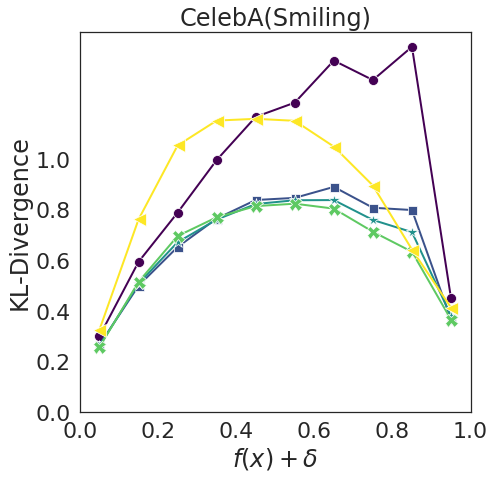

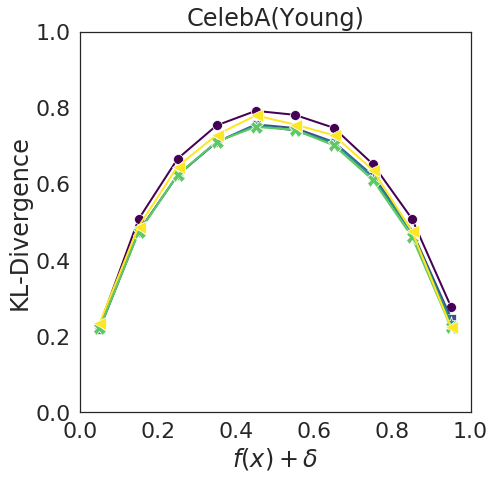

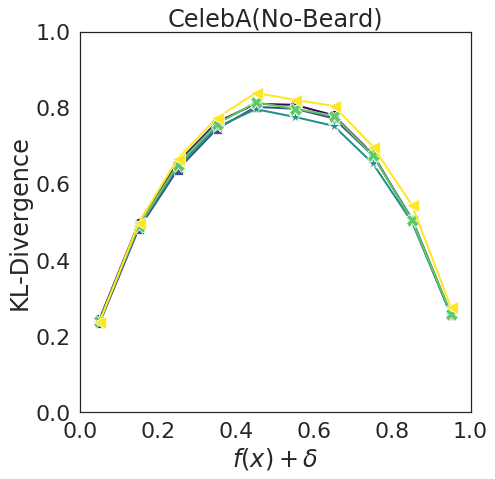

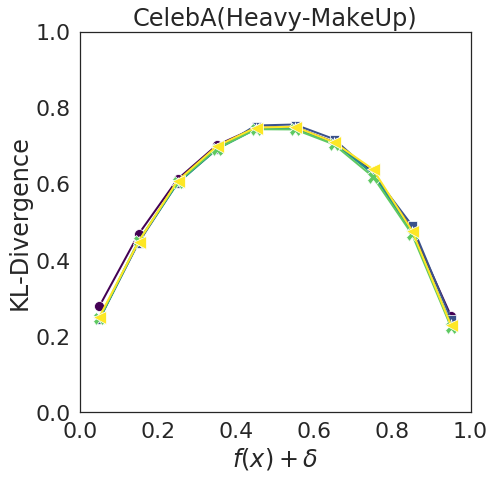

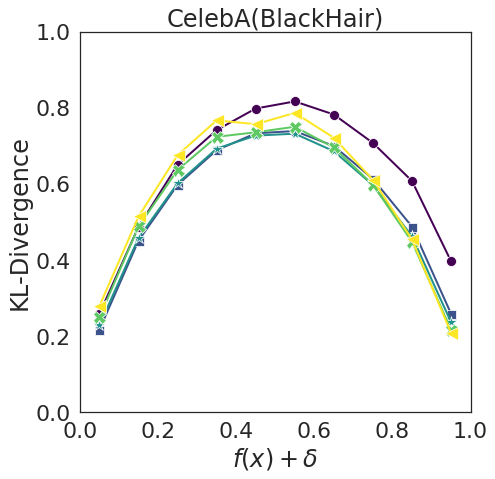

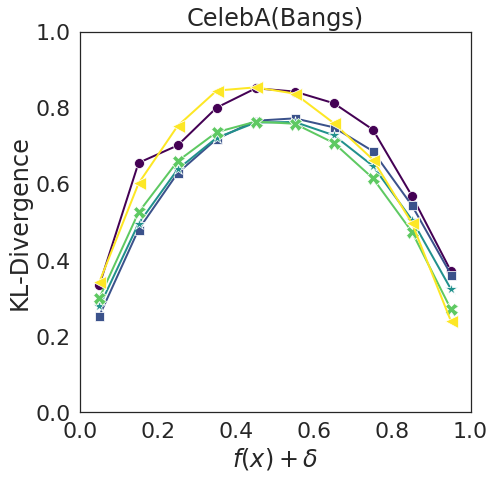

In [39]:
for iii in range(0,6):
    real_p = all_target_bins[iii] * 0.1
    real_p_ = (all_target_bins[iii]+1) * 0.1
    real_p = (real_p + real_p_)/2
    fake_q = all_target_pred[iii]
    #newcmp = ListedColormap(newcolors)
    import seaborn as sns
    sns.set(style="white")
    sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 2})
    fig = plt.figure(figsize = (7,7))
    x = np.arange(0.0, 1.0, step=0.1)
    for i in range(0,10,2):
        index = np.where(all_source_bins[iii] == i)
        target_pred_i = fake_q[index]
        source_pred_i = real_p[index]
        index = np.where(all_source_bins[iii] == i+1)
        target_pred_i = np.append(target_pred_i, fake_q[index],axis=0)
        source_pred_i = np.append(source_pred_i,real_p[index],axis=0)
        target_pred_i = np.reshape(target_pred_i,[-1,10])
        source_pred_i = np.reshape(source_pred_i,[-1,10])
        kl = []
        for k in range(10):
            p = source_pred_i[:,k]
            q = target_pred_i[:,k]
            temp = p * np.log(q) + (1-p)*np.log(1-q)
            temp = np.mean(temp) * -1
            kl.append(temp)
        
        mean_t = np.mean(target_pred_i,0)
        sd_t = np.std(target_pred_i,0)           
        mean_s = np.mean(source_pred_i,0)
        sd_s = np.std(source_pred_i,0)
        x_axis = np.arange(0.0, 1.0, step=0.1)
        #ax = sns.lineplot(mean_s, mean_t, markers=True, dashes=True)
        ax = sns.lineplot(mean_s,kl,label=names[i],c=newcolors[int(i/2)],\
                              alpha=1,marker=markers[i], markersize=makrker_size[i])
    plt.xticks(np.arange(0, 1.1, step=0.2))
    plt.yticks(np.arange(0, 1.1, step=0.2))
    ax.get_legend().remove()
    #plt.legend(loc=2)
    plt.xlabel( r'$f(x)+\delta$' )
    plt.ylabel('KL-Divergence')
    plt.title('CelebA('+attribute[iii]+')')
    #fig.colorbar(im, ax=axs)
    plt.show()

# Test: Is Identity is preserved in generated images

## Read all embeddings

In [41]:
embedding = []
s_embedding = []
names = []
for i in range(n):
    for j in range(len(start[i])):
        i_embed = np.load(os.path.join(main_dir, gan_exp[i], 'embedding'+str(start[i][j])+'.npy'))
        i_embed = np.reshape(i_embed, [-1,4*4*1024])
        s_embed = np.load(os.path.join(main_dir, gan_exp[i], 's_embedding'+str(start[i][j])+'.npy'))
        s_embed = np.reshape(s_embed, [-1,10,4,4,1024])
        s_embed = np.reshape(s_embed, [-1,10,4*4*1024])
        s_embed = np.mean(s_embed, axis=1)
        name = np.load(os.path.join(main_dir, gan_exp[i], 'names'+str(start[i][j])+'.npy'))
        
        if j == 0:
            i_embed_all = i_embed
            s_embed_all = s_embed
            names_all = name
        else:
            i_embed_all = np.append(i_embed_all,i_embed,axis=0)
            s_embed_all = np.append(s_embed_all,s_embed,axis=0)
            names_all = np.append(names_all,name,axis=0)
    print(attribute[i], i_embed_all.shape)
    print(attribute[i], s_embed_all.shape)
    print(attribute[i], names_all.shape)
    embedding.append(i_embed_all)
    s_embedding.append(s_embed_all)
    names.append(names_all)

('Smiling', (40000, 16384))
('Smiling', (4000, 16384))
('Smiling', (4000,))
('Young', (52440, 16384))
('Young', (5244, 16384))
('Young', (5244,))
('No-Beard', (20040, 16384))
('No-Beard', (2004, 16384))
('No-Beard', (2004,))
('Heavy-MakeUp', (16040, 16384))
('Heavy-MakeUp', (1604, 16384))
('Heavy-MakeUp', (1604,))
('BlackHair', (16040, 16384))
('BlackHair', (1604, 16384))
('BlackHair', (1604,))
('Bangs', (39920, 16384))
('Bangs', (3992, 16384))
('Bangs', (3992,))


## Measure based on condition as in paper

...........................Smiling.............
((44000, 100), (44000,))
((44000, 11), (44000, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
87.9975
...........................Young.............
((57684, 100), (57684,))
((57684, 11), (57684, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
81.6399694889
...........................No-Beard.............


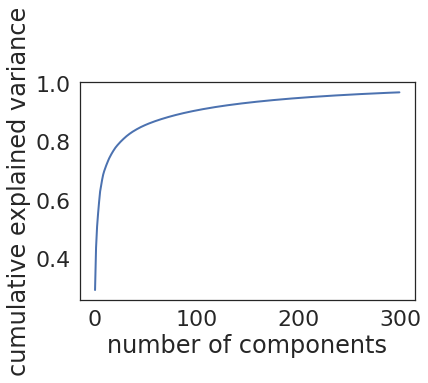

((22044, 300), (22044,))
{'speedup': 897.75, 'iterations': 5, 'multi_probe_level_': 2L, 'cb_index': 0.0, 'centers_init': 'default', 'log_level': 'info', 'build_weight': 0.009999999776482582, 'leaf_max_size': 4, 'memory_weight': 0.0, 'sample_fraction': 0.10000000149011612, 'checks': 9, 'max_neighbors': -1, 'random_seed': 786412469, 'trees': 1, 'target_precision': 0.8999999761581421, 'table_number_': 12L, 'sorted': 1, 'branching': 32, 'algorithm': 'default', 'key_size_': 20L, 'eps': 0.0, 'cores': 0}
((22044, 11), (22044, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
89.5758483034
...........................Heavy-MakeUp.............


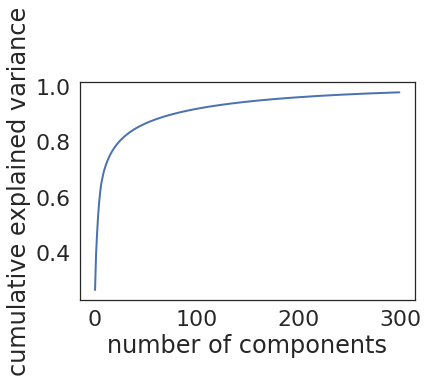

((17644, 300), (17644,))
{'speedup': 737.9999389648438, 'iterations': 5, 'multi_probe_level_': 2L, 'cb_index': 0.0, 'centers_init': 'default', 'log_level': 'info', 'build_weight': 0.009999999776482582, 'leaf_max_size': 4, 'memory_weight': 0.0, 'sample_fraction': 0.10000000149011612, 'checks': 8, 'max_neighbors': -1, 'random_seed': 101541930, 'trees': 1, 'target_precision': 0.8999999761581421, 'table_number_': 12L, 'sorted': 1, 'branching': 32, 'algorithm': 'default', 'key_size_': 20L, 'eps': 0.0, 'cores': 0}
((17644, 11), (17644, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
89.2705735661
...........................BlackHair.............


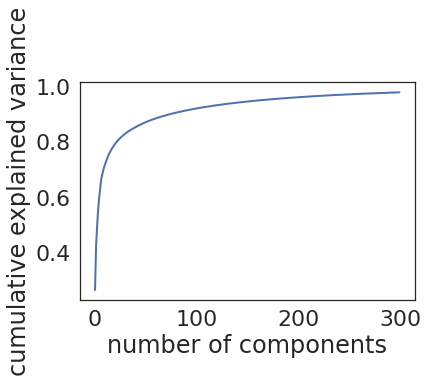

((17644, 300), (17644,))
{'speedup': 676.5, 'iterations': 5, 'multi_probe_level_': 2L, 'cb_index': 0.0, 'centers_init': 'default', 'log_level': 'info', 'build_weight': 0.009999999776482582, 'leaf_max_size': 4, 'memory_weight': 0.0, 'sample_fraction': 0.10000000149011612, 'checks': 10, 'max_neighbors': -1, 'random_seed': 27256221, 'trees': 1, 'target_precision': 0.8999999761581421, 'table_number_': 12L, 'sorted': 1, 'branching': 32, 'algorithm': 'default', 'key_size_': 20L, 'eps': 0.0, 'cores': 0}
((17644, 11), (17644, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
79.3827930175
...........................Bangs.............


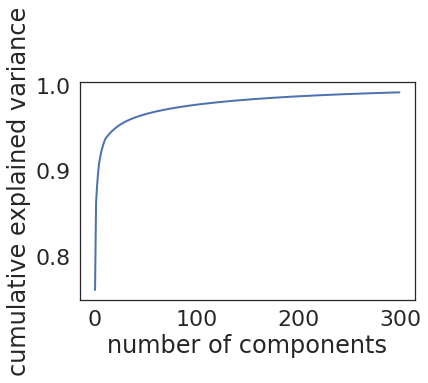

((43912, 300), (43912,))
{'speedup': 1134.0, 'iterations': 5, 'multi_probe_level_': 2L, 'cb_index': 0.0, 'centers_init': 'default', 'log_level': 'info', 'build_weight': 0.009999999776482582, 'leaf_max_size': 4, 'memory_weight': 0.0, 'sample_fraction': 0.10000000149011612, 'checks': 9, 'max_neighbors': -1, 'random_seed': 434941065, 'trees': 4, 'target_precision': 0.8999999761581421, 'table_number_': 12L, 'sorted': 1, 'branching': 32, 'algorithm': 'default', 'key_size_': 20L, 'eps': 0.0, 'cores': 0}
((43912, 11), (43912, 11))
% of times the condition is observed: 
Condition says: % of the times a given fake image is closer to the corresponding real image     then any other fake images.  
76.5330661323


In [42]:
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
for i in range(n):
    print("..........................."+attribute[i] + ".............")
    identity_label = np.repeat(np.asarray(range(s_embedding[i].shape[0])),repeats=10)   
    identity_label = np.append(identity_label, np.asarray(range(s_embedding[i].shape[0])))
    all_embeddings = np.append(embedding[i],s_embedding[i],axis=0 )
    try:
        all_embed_pca = np.load(os.path.join(main_dir, gan_exp[i],'all_embeds.npy'))
    except:
        pca = PCA(n_components=300)
        pca.fit(all_embeddings)
        all_embed_pca = pca.fit_transform(all_embeddings)
        plt.plot(np.cumsum(pca.explained_variance_ratio_))
        plt.xlabel('number of components')
        plt.ylabel('cumulative explained variance')
        plt.show()
        np.save(os.path.join(main_dir, gan_exp[i],'all_embeds.npy'), all_embed_pca)
    print(all_embed_pca.shape,identity_label.shape)
    np.save(os.path.join(main_dir, gan_exp[i],'all_identity.npy'),identity_label)
    try:
        result = np.load(os.path.join(main_dir, gan_exp[i],'resuls_11.npy'))
        dists = np.load(os.path.join(main_dir, gan_exp[i],'dist_11.npy'))
    except:
        flann = FLANN()
        params = flann.build_index(all_embed_pca, algorithm="autotuned", target_precision=0.9, log_level = "info")
        print (params)
        result, dists = flann.nn_index(all_embed_pca,11, checks=params["checks"]);
        np.save(os.path.join(main_dir, gan_exp[i],'resuls_11.npy'), result)
        np.save(os.path.join(main_dir, gan_exp[i],'dist_11.npy'), dists) 

    print(result.shape, dists.shape)
    num = embedding[i].shape[0]
    result = result[0:num]
    result = np.reshape(result, [-1,10,11]) #result of all fake images
    result_to_identity = identity_label[result] #identity of all fake images
    count = 0
    for j in range(result_to_identity.shape[0]): #For each identity
        for k in range(10): #look at all the fake images
            current_neigh = result[j][k] #The 11 NN
            current_source = result_to_identity[j][k]
            curr_index = np.where(current_neigh == num+j) #NN Index where identity of fake image == real image
            #pdb.set_trace()
            if curr_index[0].shape[0] == 0:
                count+=1 #Real source is not in NN (failed)
            else:
                temp = current_source[0:curr_index[0][0]] #NN before the actual source image
                temp = (temp!=j).astype(int) #Check is those NN have different identity then source image
                count1 = np.sum(temp)
                if count1 > 0:
                    count += 1 #count as failed
                    #pdb.set_trace()
    print("% of times the condition is observed: ")
    print("Condition says: % of the times a given fake image is closer to the corresponding real image \
    then any other fake images.  ")
    print(100 - (float(count)/embedding[i].shape[0]) * 100)  


## Measure: NN has same identity as itself. NN can be other generated image of a given source image

In [43]:
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
for i in range(n):
    print("..........................."+attribute[i] + ".............")
    identity_label = np.repeat(np.asarray(range(s_embedding[i].shape[0])),repeats=10)   
    identity_label = np.append(identity_label, np.asarray(range(s_embedding[i].shape[0])))
    all_embeddings = np.append(embedding[i],s_embedding[i],axis=0 )
    all_embed_pca = np.load(os.path.join(main_dir, gan_exp[i],'all_embeds.npy'))
    print(all_embed_pca.shape,identity_label.shape)

    result = np.load(os.path.join(main_dir, gan_exp[i],'resuls_11.npy'))
    dists = np.load(os.path.join(main_dir, gan_exp[i],'dist_11.npy'))   
    result_to_identity = identity_label[result]
    result_to_identity = result_to_identity[:,1] #first nearest neighbor
    
    print("% of times the nearest neighbor have same identity as the source image: ")
    print(accuracy_score(identity_label, result_to_identity) * 100) 
    index_wrong1 = np.where(identity_label != result_to_identity)
    

...........................Smiling.............
((44000, 100), (44000,))
% of times the nearest neighbor have same identity as the source image: 
98.35681818181818
...........................Young.............
((57684, 100), (57684,))
% of times the nearest neighbor have same identity as the source image: 
98.37909992372235
...........................No-Beard.............
((22044, 300), (22044,))
% of times the nearest neighbor have same identity as the source image: 
99.7005988023952
...........................Heavy-MakeUp.............
((17644, 300), (17644,))
% of times the nearest neighbor have same identity as the source image: 
99.36522330537294
...........................BlackHair.............
((17644, 300), (17644,))
% of times the nearest neighbor have same identity as the source image: 
99.3708909544321
...........................Bangs.............
((43912, 300), (43912,))
% of times the nearest neighbor have same identity as the source image: 
99.43523410457277


## Face Recoginition to check identiy preservation

Use pretrained VGGFace2 model developed by researchers at the Visual Geometry Group at Oxford as feature extractor. Extract features for both real and fake images. Caculate closeness between real and fake image as Euclidean distance or Cosine distance

In [49]:
for i in range(n):
    print(input_img[i].shape, fake_img[i].shape, a_input_img[i].shape, a_fake_img[i].shape)

((4000, 128, 128, 3), (40000, 128, 128, 3), (4000, 128, 128, 3), (40000, 128, 128, 3))
((5244, 128, 128, 3), (52440, 128, 128, 3), (5244, 128, 128, 3), (52440, 128, 128, 3))
((2004, 128, 128, 3), (20040, 128, 128, 3), (2004, 128, 128, 3), (20040, 128, 128, 3))
((1604, 128, 128, 3), (16040, 128, 128, 3), (1604, 128, 128, 3), (16040, 128, 128, 3))
((1604, 128, 128, 3), (16040, 128, 128, 3), (1604, 128, 128, 3), (16040, 128, 128, 3))
((3992, 128, 128, 3), (39920, 128, 128, 3), (3992, 128, 128, 3), (39920, 128, 128, 3))


In [47]:
for i in range(n): 
    a_fake_img[i] = np.reshape(a_fake_img[i] , [-1,input_size,input_size,3])

In [48]:
# create a vggface2 model
model = VGGFace(model='resnet50', include_top=False, input_shape=(224, 224, 3), pooling='avg')
# summarize input and output shape
print('Inputs: %s' % model.inputs)
print('Outputs: %s' % model.outputs)

Inputs: [<tf.Tensor 'input_1:0' shape=(?, 224, 224, 3) dtype=float32>]
Outputs: [<tf.Tensor 'global_average_pooling2d_1/Mean:0' shape=(?, 2048) dtype=float32>]


### Fake Embedding

In [51]:
batch_size = 100
for i in range(0,6):
    if os.path.exists(os.path.join(main_dir, gan_exp[i], 'embedding_face_net_fake_images.npy')):
        continue
    num_batch = a_fake_img[i].shape[0] // batch_size
    fake_embed = np.empty([])
    for j in range(0,160):
        fake_batch = a_fake_img[i][j*batch_size:j*batch_size + batch_size]
        curr_batch = []
        for k in range(fake_batch.shape[0]):
            curr_batch.append(scm.imresize(fake_batch[k], [224, 224, 3]))
        curr_batch = np.asarray(curr_batch)
        embedding = model.predict(curr_batch)
        if j == 0:
            fake_embed =  model.predict(curr_batch)
        else:
            fake_embed = np.append(fake_embed, model.predict(curr_batch), axis=0)
    np.save(os.path.join(main_dir, gan_exp[i], 'embedding_face_net_fake_images.npy'),fake_embed)
    print(fake_embed.shape, a_fake_img[i].shape)

((16000, 2048), (20040, 128, 128, 3))
((16000, 2048), (16040, 128, 128, 3))
((16000, 2048), (16040, 128, 128, 3))
((16000, 2048), (39920, 128, 128, 3))


### Real embedding

In [52]:
batch_size = 100
for i in range(0,6):
    if os.path.exists(os.path.join(main_dir, gan_exp[i], 'embedding_face_net_real_images.npy')):
        continue
    num_batch = a_input_img[i].shape[0] // batch_size
    fake_embed = np.empty([])
    for j in range(0,16):
        fake_batch = a_input_img[i][j*batch_size:j*batch_size + batch_size]
        curr_batch = []
        for k in range(fake_batch.shape[0]):
            curr_batch.append(scm.imresize(fake_batch[k], [224, 224, 3]))
        curr_batch = np.asarray(curr_batch)
        embedding = model.predict(curr_batch)
        if j == 0:
            fake_embed =  model.predict(curr_batch)
        else:
            fake_embed = np.append(fake_embed, model.predict(curr_batch), axis=0)
    np.save(os.path.join(main_dir, gan_exp[i], 'embedding_face_net_real_images.npy'),fake_embed)
    print(fake_embed.shape, a_input_img[i].shape)

((1600, 2048), (2004, 128, 128, 3))
((1600, 2048), (1604, 128, 128, 3))
((1600, 2048), (1604, 128, 128, 3))
((1600, 2048), (3992, 128, 128, 3))


## Score

In [53]:
for iii in range(0,6):
    real_embed = np.load(os.path.join(main_dir, gan_exp[iii], 'embedding_face_net_real_images.npy'))
    fake_embed = np.load(os.path.join(main_dir, gan_exp[iii], 'embedding_face_net_fake_images.npy'))
    print(real_embed.shape, fake_embed.shape)
    fake_embed = np.reshape(fake_embed, [-1,10,2048])
    print("Attribute: ",attribute[iii])
    scores = np.zeros([real_embed.shape[0],10])
    for i in range(real_embed.shape[0]):
        for j in range(10):
            scores[i,j] = cosine(real_embed[i], fake_embed[i,j])
    for threshold in [0.1,0.2,0.3,0.4,0.5, 0.6, 0.7, 0.8, 0.9]:
        temp = (scores <= threshold ).astype(int)
        overall = np.sum(temp)
        print("For threshold: ", threshold, " % fake images with same identity as source: ",\
             float(overall)/(scores.shape[0] * 10))

((4000, 2048), (40000, 2048))
('Attribute: ', 'Smiling')
('For threshold: ', 0.1, ' % fake images with same identity as source: ', 0.000225)
('For threshold: ', 0.2, ' % fake images with same identity as source: ', 0.01765)
('For threshold: ', 0.3, ' % fake images with same identity as source: ', 0.1941)
('For threshold: ', 0.4, ' % fake images with same identity as source: ', 0.562525)
('For threshold: ', 0.5, ' % fake images with same identity as source: ', 0.853025)
('For threshold: ', 0.6, ' % fake images with same identity as source: ', 0.952925)
('For threshold: ', 0.7, ' % fake images with same identity as source: ', 0.970325)
('For threshold: ', 0.8, ' % fake images with same identity as source: ', 0.976475)
('For threshold: ', 0.9, ' % fake images with same identity as source: ', 0.993875)
((3100, 2048), (31900, 2048))
('Attribute: ', 'Young')
('For threshold: ', 0.1, ' % fake images with same identity as source: ', 0.0006129032258064516)
('For threshold: ', 0.2, ' % fake imag

# Test: Generated images are real looking : FID

In [54]:
start 

[['', 1], ['', 804, 2388], [0], [0], [0], ['', 2004]]

## Get model ready

In [55]:
tfgan = tf.contrib.gan
session=tf.InteractiveSession()
BATCH_SIZE = 64
inception_images = tf.placeholder(tf.float32, [None, None, None, 3])
activations1 = tf.placeholder(tf.float32, [None, None], name = 'activations1')
activations2 = tf.placeholder(tf.float32, [None, None], name = 'activations2')
fcd = tfgan.eval.frechet_classifier_distance_from_activations(activations1, activations2)
def inception_activations(images = inception_images, num_splits = 1):
    #images = tf.transpose(images, [0, 2, 3, 1])
    size = 299
    images = tf.image.resize_bilinear(images, [size, size])
    generated_images_list = array_ops.split(images, num_or_size_splits = num_splits)
    activations = tf.map_fn(
        fn = functools.partial(tfgan.eval.run_inception, output_tensor = 'pool_3:0'),
        elems = array_ops.stack(generated_images_list),
        parallel_iterations = 1,
        back_prop = False,
        swap_memory = True,
        name = 'RunClassifier')
    activations = array_ops.concat(array_ops.unstack(activations), 0)
    return activations

activations =inception_activations()
def get_inception_activations(inps):
    n_batches = int(np.ceil(float(inps.shape[0]) / BATCH_SIZE))
    act = np.zeros([inps.shape[0], 2048], dtype = np.float32)
    for i in range(n_batches):
        inp = inps[i * BATCH_SIZE : (i + 1) * BATCH_SIZE] 
        if inp.shape[3]!=3:
            inp = np.tile(inp,[1,1,1,3])   
        act[i * BATCH_SIZE : i * BATCH_SIZE + min(BATCH_SIZE, inp.shape[0])] = session.run(activations, feed_dict = {inception_images: inp})
    return act

## Calculate FID

In [56]:
for i in range(0,6):
    fake_img[i] = np.reshape(fake_img[i], [-1,128,128,num_channel[i]])
    print(input_img[i].shape, fake_img[i].shape)
    print(input_pred[i].shape, fake_pred[i].shape)
    

((4000, 128, 128, 3), (40000, 128, 128, 3))
((4000, 2), (40000, 2))
((5244, 128, 128, 3), (52440, 128, 128, 3))
((5244, 2), (52440, 2))
((2004, 128, 128, 3), (20040, 128, 128, 3))
((2004, 2), (20040, 2))
((1604, 128, 128, 3), (16040, 128, 128, 3))
((1604, 2), (16040, 2))
((1604, 128, 128, 3), (16040, 128, 128, 3))
((1604, 2), (16040, 2))
((3992, 128, 128, 3), (39920, 128, 128, 3))
((3992, 2), (39920, 2))


In [57]:
for i in range(0,6):
    print('.............Bin 0..............')
    real_pred = input_pred[i][:,main_index[i]]
    index = np.where(real_pred < 0.1)
    real_img_0 = input_img[i][index]
    if real_img_0.shape[0] > 3000:
        real_img_0 = real_img_0[0:3000]
    fake_pred_0 = fake_pred[i][:,main_index[i]]
    index = np.where(fake_pred_0 < 0.1)
    fake_img_0 = fake_img[i][index]
    if fake_img_0.shape[0] > 3000:
        fake_img_0 = fake_img_0[0:3000]
    print(real_img_0.shape, fake_img_0.shape)
    
    
    print(".........."+attribute[i]+".............")
    act1 = get_inception_activations(real_img_0)
    print(act1.shape)
    act2 = get_inception_activations(fake_img_0)
    print(act2.shape)
    fid = session.run(fcd, feed_dict = {activations1: act1, activations2: act2})
    print("Absent FID: ", fid)
    
    print('.............Bin 9..............')
    real_pred = input_pred[i][:,main_index[i]]
    index = np.where(real_pred >= 0.9)
    real_img_0 = input_img[i][index]
    if real_img_0.shape[0] > 3000:
        real_img_0 = real_img_0[0:3000]
    fake_pred_0 = fake_pred[i][:,main_index[i]]
    index = np.where(fake_pred_0 >= 0.9)
    fake_img_0 = fake_img[i][index]
    if fake_img_0.shape[0] > 3000:
        fake_img_0 = fake_img_0[0:3000]
    print(real_img_0.shape, fake_img_0.shape)
    
    
    print(".........."+attribute[i]+".............")
    act1 = get_inception_activations(real_img_0)
    print(act1.shape)
    act2 = get_inception_activations(fake_img_0)
    print(act2.shape)
    fid = session.run(fcd, feed_dict = {activations1: act1, activations2: act2})
    print("Present FID: ", fid)
    
    print('.............OverAll..............')
    real_img_0 = input_img[i]
    if real_img_0.shape[0] > 3000:
        real_img_0 = real_img_0[0:3000]
    fake_img_0 = fake_img[i]
    if fake_img_0.shape[0] > 3000:
        fake_img_0 = fake_img_0[0:3000]
    print(real_img_0.shape, fake_img_0.shape)
    
    
    print(".........."+attribute[i]+".............")
    act1 = get_inception_activations(real_img_0)
    print(act1.shape)
    act2 = get_inception_activations(fake_img_0)
    print(act2.shape)
    fid = session.run(fcd, feed_dict = {activations1: act1, activations2: act2})
    print("OverAll FID: ", fid)


.............Bin 0..............
((403, 128, 128, 3), (3000, 128, 128, 3))
..........Smiling.............
(403, 2048)
(3000, 2048)
('Absent FID: ', 56.33595)
.............Bin 9..............
((388, 128, 128, 3), (3000, 128, 128, 3))
..........Smiling.............
(388, 2048)
(3000, 2048)
('Present FID: ', 46.971577)
.............OverAll..............
((3000, 128, 128, 3), (3000, 128, 128, 3))
..........Smiling.............
(3000, 2048)
(3000, 2048)
('OverAll FID: ', 35.835644)
.............Bin 0..............
((524, 128, 128, 3), (3000, 128, 128, 3))
..........Young.............
(524, 2048)
(3000, 2048)
('Absent FID: ', 74.37725)
.............Bin 9..............
((532, 128, 128, 3), (3000, 128, 128, 3))
..........Young.............
(532, 2048)
(3000, 2048)
('Present FID: ', 67.58085)
.............OverAll..............
((3000, 128, 128, 3), (3000, 128, 128, 3))
..........Young.............
(3000, 2048)
(3000, 2048)
('OverAll FID: ', 53.45592)
.............Bin 0..............
((211, 128,

## Get more real images

In [30]:
for i in range(0,3):
    print('.............Bin 0..............')
    real_pred = input_pred[i][:,main_index[i]]
    index = np.where(real_pred < 0.3)
    real_img_0 = input_img[i][index]
    if real_img_0.shape[0] > 3000:
        real_img_0 = real_img_0[0:3000]
    fake_pred_0 = fake_pred[i][:,main_index[i]]
    index = np.where(fake_pred_0 < 0.1)
    fake_img_0 = fake_img[i][index]
    if fake_img_0.shape[0] > 3000:
        fake_img_0 = fake_img_0[0:3000]
    print(real_img_0.shape, fake_img_0.shape)
    
    
    print(".........."+attribute[i]+".............")
    act1 = get_inception_activations(real_img_0)
    print(act1.shape)
    act2 = get_inception_activations(fake_img_0)
    print(act2.shape)
    fid = session.run(fcd, feed_dict = {activations1: act1, activations2: act2})
    print("Absent FID: ", fid)
    
    print('.............Bin 9..............')
    real_pred = input_pred[i][:,main_index[i]]
    index = np.where(real_pred >= 0.7)
    real_img_0 = input_img[i][index]
    if real_img_0.shape[0] > 3000:
        real_img_0 = real_img_0[0:3000]
    fake_pred_0 = fake_pred[i][:,main_index[i]]
    index = np.where(fake_pred_0 >= 0.9)
    fake_img_0 = fake_img[i][index]
    if fake_img_0.shape[0] > 3000:
        fake_img_0 = fake_img_0[0:3000]
    print(real_img_0.shape, fake_img_0.shape)
    
    
    print(".........."+attribute[i]+".............")
    act1 = get_inception_activations(real_img_0)
    print(act1.shape)
    act2 = get_inception_activations(fake_img_0)
    print(act2.shape)
    fid = session.run(fcd, feed_dict = {activations1: act1, activations2: act2})
    print("Absent FID: ", fid)


.............Bin 0..............
((1152, 128, 128, 3), (3000, 128, 128, 3))
..........Smiling.............
(1152, 2048)
(3000, 2048)
('Absent FID: ', 40.36823)
.............Bin 9..............
((1183, 128, 128, 3), (3000, 128, 128, 3))
..........Smiling.............
(1183, 2048)
(3000, 2048)
('Absent FID: ', 34.974613)
.............Bin 0..............
((1590, 128, 128, 3), (3000, 128, 128, 3))
..........Young.............
(1590, 2048)
(3000, 2048)
('Absent FID: ', 54.99132)
.............Bin 9..............
((1565, 128, 128, 3), (3000, 128, 128, 3))
..........Young.............
(1565, 2048)
(3000, 2048)
('Absent FID: ', 52.624985)
.............Bin 0..............
((1103, 128, 128, 1), (3000, 128, 128, 1))
..........Cardiomegaly.............
(1103, 2048)
(3000, 2048)
('Absent FID: ', 67.22585)
.............Bin 9..............
((1154, 128, 128, 1), (1904, 128, 128, 1))
..........Cardiomegaly.............
(1154, 2048)
(1904, 2048)
('Absent FID: ', 65.506)
